<a href="https://colab.research.google.com/github/sal2212/HIFU-Filter-GAN/blob/main/HIFU_filter_AI_(distribution).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import os
import pickle
import random
import shutil
import time
import scipy.io as io
import h5py
import sys
import datetime
import subprocess

from PIL import Image
from IPython import display
from natsort import natsorted, ns
from zipfile import ZipFile

import tensorflow as tf

In [2]:
tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [3]:
def unzip_if_missing(url, target, extract=True):
  if not os.path.exists(target):
    with ZipFile(url, 'r') as zip_ref:
      zip_ref.extractall(target)

In [4]:
project_root = 'B:\Filter-AI'
data_root = 'B:\Filter-AI\data'
#rcvdata_url = "https://storage.googleapis.com/skull-data/rcvdataHIFU.zip"
rcvdata_file = os.path.join(data_root, "rcvdataHIFU.zip")
rcvdata_folder = os.path.join(data_root, 'rcvdata')
datenow = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
working_directory = os.path.join(project_root,datenow)
unzip_if_missing(rcvdata_file,rcvdata_folder)

In [5]:
cd $project_root

B:\Filter-AI


In [6]:
if not os.path.exists(working_directory):
  !mkdir $working_directory

In [126]:
predictions_folder = os.path.join(working_directory,'predictions')
image_folder = os.path.join(working_directory,'images')
checkpoints_folder = os.path.join(working_directory,'checkpoints')
evaluation_folder = os.path.join(working_directory,'evaluation')
if not os.path.exists(evaluation_folder):
  !mkdir $predictions_folder
  !mkdir $image_folder
  !mkdir $checkpoints_folder
  !mkdir $evaluation_folder

In [8]:
ls -lhrt $working_directory

 Volume in drive B is Pelican
 Volume Serial Number is F6B0-23E3

 Directory of B:\Filter-AI


 Directory of B:\Filter-AI\20201208-192525

12/08/2020  07:25 PM    <DIR>          .
12/08/2020  07:25 PM    <DIR>          ..
12/08/2020  07:25 PM    <DIR>          checkpoints
12/08/2020  07:25 PM    <DIR>          images
12/08/2020  07:25 PM    <DIR>          predictions
               0 File(s)              0 bytes
               5 Dir(s)  57,417,519,104 bytes free


File Not Found


In [9]:
def load_npy(item):
    data = np.load(item.numpy())
    return data.astype(np.float32)

def process_path(filePath):
    mask = tf.py_function(load_npy, [filePath], tf.float32)
    mask.set_shape([num_elements,num_samples])
    return tf.expand_dims(mask,2)

num_elements = 128
num_samples = 896

classes = os.listdir(rcvdata_folder)
artifact_files = os.listdir(os.path.join(rcvdata_folder,classes[0]))
RF_files = os.listdir(os.path.join(rcvdata_folder,classes[1]))
artifact_files = natsorted(artifact_files, key=lambda y: y.lower())
RF_files = natsorted(RF_files, key=lambda y: y.lower())

artifact_files = [os.path.join(rcvdata_folder,classes[0]) + '/' + x for x in artifact_files]
RF_files = [os.path.join(rcvdata_folder,classes[1]) + '/' + x for x in RF_files]

RF_ds = tf.data.Dataset.from_tensor_slices(RF_files)
RF_ds = RF_ds.map(process_path,num_parallel_calls=tf.data.experimental.AUTOTUNE)
HIFU_ds = tf.data.Dataset.from_tensor_slices(artifact_files)
HIFU_ds = HIFU_ds.map(process_path,num_parallel_calls=tf.data.experimental.AUTOTUNE)

full_ds = tf.data.Dataset.zip((HIFU_ds,RF_ds))
print(full_ds)

<ZipDataset shapes: ((128, 896, 1), (128, 896, 1)), types: (tf.float32, tf.float32)>


In [448]:
# make sure file names match
print(RF_files[5000])
print(artifact_files[5000])
print(len(RF_files))

B:\Filter-AI\data\rcvdata\RF/5000-RF-stim_3_12-December-2018_12-02-44-1-1.npy
B:\Filter-AI\data\rcvdata\artifact/5000-HIFU-stim_3_12-December-2018_12-02-44-1-1.npy
15190


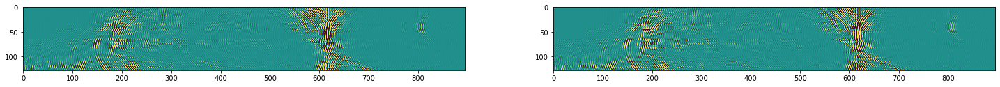

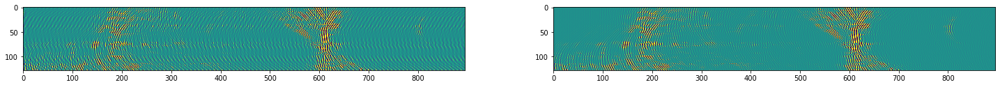

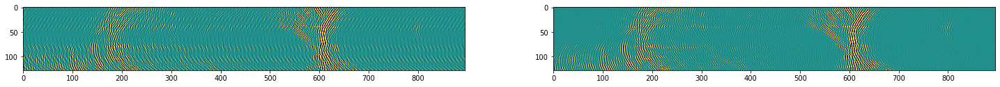

In [11]:
#example of input data
for img, phantom in full_ds.take(3):
  fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(25,15))
  ax1.imshow(img[:,:,0],vmin=-0.25,vmax=0.25)
  ax2.imshow(phantom[:,:,0],vmin=-0.25,vmax=0.25)
  plt.savefig(os.path.join(working_directory,'sample_data.png'))

In [12]:
BATCH_SIZE = 10
BUFFER_SIZE = 1000
np.random.seed(42)

def create_dataset(ds, cache=True, shuffle_buffer_size=1000):
  if cache:
    if isinstance(cache, str):
      ds = ds.cache(cache)
    else:
      ds = ds.cache()
  ds = ds.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
  ds = ds.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
  return ds

def split_data(data, num_samples, split_percentage = [.2, .8]):
  test_size = round(.2 * num_samples)
  train_size = round(.8 * num_samples)
  train_ds = data.take(train_size)
  test_ds = data.skip(train_size)
  test_ds = test_ds.take(test_size)
  train_ds = create_dataset(train_ds)
  test_ds = create_dataset(test_ds) 
  return train_ds, test_ds

In [13]:
# split the data in a 20-80 split
train_data, test_data = split_data(full_ds, num_samples,[.2, .8])
print(test_data)

<PrefetchDataset shapes: ((None, 128, 896, 1), (None, 128, 896, 1)), types: (tf.float32, tf.float32)>


HIFU RF data shape:  (10, 128, 896, 1)
normal RF data shape:  (10, 128, 896, 1)


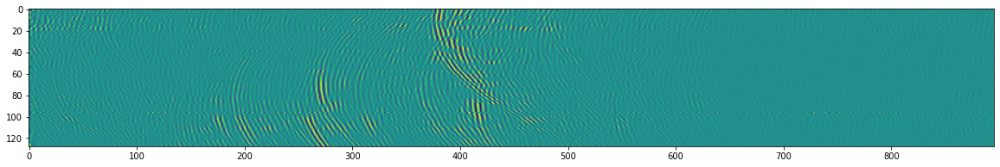

In [14]:
for ((image),(image2)) in train_data.take(1):
  print("HIFU RF data shape: ", image.numpy().shape)
  print("normal RF data shape: ", image2.numpy().shape)
  plt.figure(1,figsize=(20,10))
  plt.imshow(image[0,:,:,0])

In [15]:
EPOCHS = 500
log_dir="./logs/"

summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datenow)

In [16]:
def generate_images(model, test_input, tar, epoch = 0, checkpoint_dir = '~', savedata = 0):
  prediction = model(test_input, training=True)
  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']
  plt.figure(10,figsize=(25,10))
  for i in range(3):
    plt.subplot(3, 1, i+1)
    plt.title(title[i])
    # getting the pixel values between [0, 1] to plot it.
    plt.imshow(np.squeeze(display_list[i]) * 0.5 + 0.5)
    plt.axis('off')
  if (savedata):
    plt.savefig(os.path.join(image_folder,'image_at_epoch_{:04d}.png'.format(epoch)))
    np.save(os.path.join(predictions_folder,'prediction_epoch{:04d}.npy'.format(epoch)),prediction[0])
  plt.show()

In [17]:
%load_ext tensorboard
#%tensorboard --logdir {log_dir}
%tensorboard --logdir logs/ --host localhost --port 8000

Reusing TensorBoard on port 8000 (pid 12748), started 6:36:06 ago. (Use '!kill 12748' to kill it.)

In [18]:
def downsample(filters, size, apply_batchnorm=True):
  initializer = tf.random_normal_initializer(0., 0.02)
  result = tf.keras.Sequential()
  
  #result.add(tf.keras.layers.Conv2D(filters, size, strides = (1,1), padding='same',kernel_initializer=initializer, use_bias=False))
  result.add(
      tf.keras.layers.Conv2D(filters, size, strides=(2,2), padding='same',
                             kernel_initializer=initializer, use_bias=False))
  
  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())
  result.add(tf.keras.layers.LeakyReLU())
  return result

def upsample(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)
  result = tf.keras.Sequential()
  result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=(2,2),
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))
  #result.add(tf.keras.layers.Conv2DTranspose(filters, size, strides=(1,1),padding='same',kernel_initializer=initializer,use_bias=False))
  result.add(tf.keras.layers.BatchNormalization())
  if apply_dropout:
      result.add(tf.keras.layers.Dropout(0.3))
  result.add(tf.keras.layers.ReLU())
  return result

In [19]:
def unet_autoencoder():
  inputs = tf.keras.layers.Input(shape = (num_elements, num_samples, 1))
  initializer = tf.random_normal_initializer(0., 0.02)

  down_filts = [32, 64, 128, 256, 512]
  up_filts = [i for i in reversed(down_filts)]

  down_stack = [
                downsample(down_filts[0], 4, apply_batchnorm=True), # (bs, 48, 726, 64)
                downsample(down_filts[1], 4, apply_batchnorm=True), # (bs, 24, 544, 128)
                downsample(down_filts[2], 4, apply_batchnorm=True), # (bs, 12, 272, 256)
                downsample(down_filts[3], 4, apply_batchnorm=False), # (bs, 6, 136, 512)
                downsample(down_filts[4], 4, apply_batchnorm=False), # (bs, 3, 68, 512)
                #downsample(512, 4), # (bs, 2, 34, 512)
                #downsample(512, 4), # (bs, 1, 17, 512)
                ]
  up_stack = [
              upsample(down_filts[4], 4, apply_dropout=False), # (bs, 2, 34, 1024)
              upsample(down_filts[3], 4, apply_dropout=False), # (bs, 4, 68, 1024)
              upsample(down_filts[2], 4, apply_dropout=False), # (bs, 8, 136, 1024)
              upsample(down_filts[1], 4), # (bs, 16, 272, 1024)
              upsample(down_filts[0], 4), # (bs, 32, 544, 512)
              #upsample(64, 4), # (bs, 64, 1088, 256)
              ]
  last = tf.keras.layers.Conv2DTranspose(1, 4,
                                         strides=(2,2),
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh') # (bs, 128, 1664, 3)



  x = inputs
  # Downsampling through the model
  skips = []
  for down, filt in zip(down_stack, down_filts):
    x = tf.keras.layers.Conv2D(filt, 4, strides = (1,1), padding='same',kernel_initializer=initializer, use_bias=False)(x)
    x = down(x)
    skips.append(x)
  skips = reversed(skips[:-1])
  # Upsampling and establishing the skip connections
  for up, skip, filt in zip(up_stack, skips, up_filts):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])
    x = tf.keras.layers.Conv2D(filt, 4, strides = (1,1), padding='same',kernel_initializer=initializer, use_bias=False)(x)
  x = tf.keras.layers.Conv2D(32, 4, strides = (1,1), padding='same',kernel_initializer=initializer, use_bias=False)(x)
  x = last(x)
  return tf.keras.Model(inputs=inputs, outputs=x)


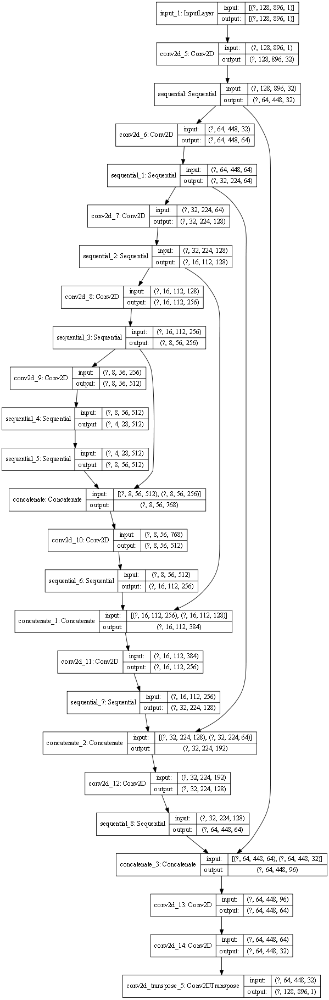

In [20]:
os.environ["PATH"] += os.pathsep + 'C:/Program Files (x86)/Graphviz2.38/bin/'
unet_AE = unet_autoencoder()
tf.keras.utils.plot_model(unet_AE, show_shapes=True, dpi=64)

In [21]:
unet_AE.summary()

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 128, 896, 1) 0                                            
__________________________________________________________________________________________________
conv2d_5 (Conv2D)               (None, 128, 896, 32) 512         input_1[0][0]                    
__________________________________________________________________________________________________
sequential (Sequential)         (None, 64, 448, 32)  16512       conv2d_5[0][0]                   
__________________________________________________________________________________________________
conv2d_6 (Conv2D)               (None, 64, 448, 64)  32768       sequential[0][0]                 
_______________________________________________________________________________________

In [22]:
#unet_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1 = 0.5)
unet_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1 = 0.9)

In [23]:
checkpoint_dir = checkpoints_folder
datenow = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

if not os.path.exists(checkpoint_dir):
  os.mkdir(os.path.join(checkpoint_dir,datenow))

if not os.path.exists(image_folder):
  os.mkdir(os.path.join(image_folder,datenow))

if not os.path.exists(predictions_folder):
  os.mkdir(os.path.join(predictions_folder,datenow))

checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(unet_optimizer=unet_optimizer,
                                 unet_AE=unet_AE)

latest = tf.train.latest_checkpoint(checkpoint_dir)
if latest != None:
  print("Loading weights from", latest)
  checkpoint.restore(latest)
else:
  print("Checkpoint not found. Starting from scratch")

Checkpoint not found. Starting from scratch


In [29]:
def unet_loss(gen_output, target, alpha=0.8):
  #MS_SSIM_loss = tf.reduce_min(-1*tf.reduce_mean(tf.image.ssim(img1=gen_output,img2=target,max_val=2)))
  MS_SSIM_loss = 1-tf.reduce_mean(tf.image.ssim_multiscale(target,gen_output,max_val=2,filter_size=3))
  AE_l1_loss = tf.reduce_mean(tf.abs(target - gen_output))
  total_unet_loss = alpha*MS_SSIM_loss + (1-alpha)*AE_l1_loss

  return total_unet_loss, MS_SSIM_loss, AE_l1_loss

In [30]:
@tf.function
def train_step(input_image, target, epoch):
  with tf.GradientTape() as AE_tape:
    AE_output = unet_AE(input_image, training=True)

    total_unet_loss, MS_SSIM_loss, AE_l1_loss = unet_loss(AE_output, target)

  AE_gradients = AE_tape.gradient(total_unet_loss, unet_AE.trainable_variables)
  
  unet_optimizer.apply_gradients(zip(AE_gradients, unet_AE.trainable_variables))

  with summary_writer.as_default():
    tf.summary.scalar('total_unet_loss', total_unet_loss, step = epoch)
    tf.summary.scalar('MS_SSIM_loss', MS_SSIM_loss, step = epoch)
    tf.summary.scalar('AE_l1_loss', AE_l1_loss, step = epoch)
  
  return total_unet_loss, MS_SSIM_loss, AE_l1_loss

In [31]:
def fit(train_ds, epochs, test_ds):
  for epoch in range(epochs):
    start = time.time()

    display.clear_output(wait=True)

    # Test
    for (input_image, target) in test_ds:
      test_accuracy = tf.get_static_value(tf.reduce_mean(tf.image.ssim_multiscale(target,unet_AE(input_image, training = False), max_val = 2, filter_size = 7)))
    with summary_writer.as_default():
      tf.summary.scalar('AE_test_accuracy',test_accuracy, step = epoch)

    for (example_input, example_target) in test_ds.take(1):
      generate_images(unet_AE, example_input, example_target, epoch, checkpoint_dir,savedata)
    print("Epoch: ", epoch)

    # Train
    for n, (input_image, target) in train_ds.enumerate():
      epoch_loss_avg = tf.keras.metrics.Mean()
      print('.', end='')
      if (n+1) % 100 == 0:
        print()
      total_unet_loss, MS_SSIM_loss, l1_loss = train_step(input_image, target, epoch)
      epoch_loss_avg(total_unet_loss)
      epoch_accuracy = tf.get_static_value(tf.reduce_mean(tf.image.ssim_multiscale(target,unet_AE(input_image, training = True), max_val = 2, filter_size = 7)))
    print()



    # saving (checkpoint) the model every 20 epochs
    #if (epoch + 1) % 20 == 0:
      #checkpoint.save(file_prefix = checkpoint_prefix)
    
    print("Epoch {:03d}: Loss: {:.3f}, Accuracy: {:.3%}".format(epoch,epoch_loss_avg.result(),epoch_accuracy))
      #print("Test set accuracy: {:.3%}".format(test_accuracy.result()))

    print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1, time.time()-start))
    if (savedata):
      checkpoint.save(file_prefix = checkpoint_prefix)

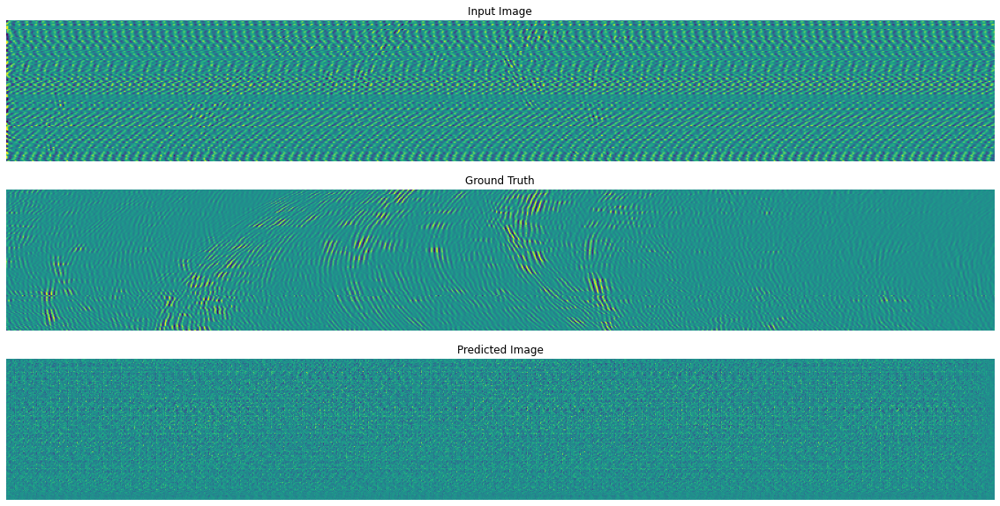

In [32]:
for (example_input, example_target) in test_data.take(1):
  generate_images(unet_AE, example_input, example_target, 0, checkpoint_dir)

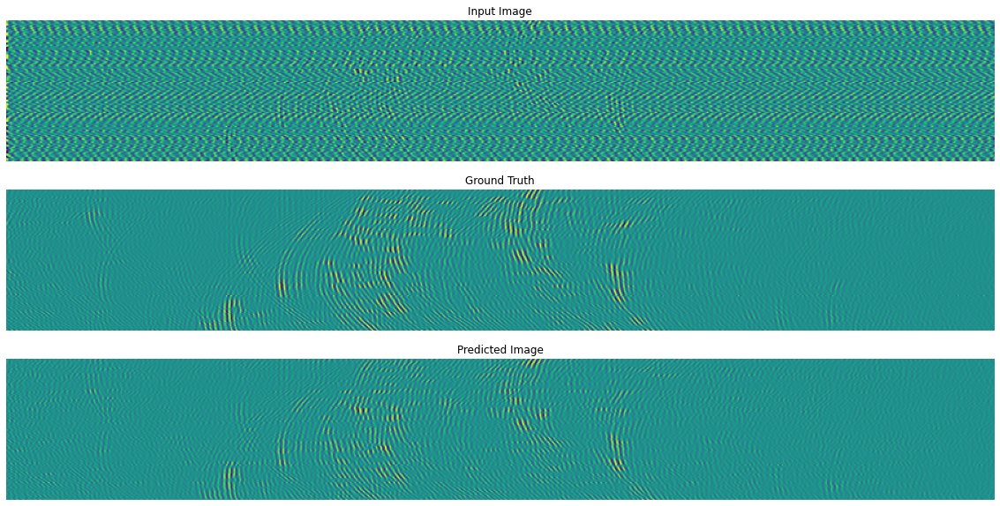

Epoch:  499
........................................................................
Epoch 499: Loss: 0.006, Accuracy: 99.826%
Time taken for epoch 500 is 119.23240518569946 sec



In [33]:
savedata = 0
fit(train_data, EPOCHS, test_data)

# Network Evaluation
The following code will beamform the results for B-mode comparison

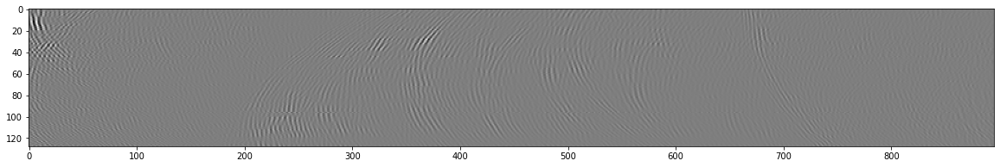

In [449]:
from sklearn import preprocessing

displacement_dir = 'H:\\Research Data\Displacement\Data\\2018-12-03\human_subject1\\2ms\\500mv'
files = (os.listdir(os.path.join(displacement_dir,'1')))
stim = 1

with h5py.File(os.path.join(displacement_dir,'1',files[stim]), mode = 'r') as f:
  for u,v in f.items():
    rcvdata = preprocessing.maxabs_scale(np.array(v),axis=1)
  f.close()

for u, v in h5py.File(os.path.join(displacement_dir,'AcqInfo1.mat'), mode = 'r').items():
  if u == 'P':
    P = v

na = int(P['na'][0][0])
maxAngle = int(P['maxAngle'][0][0])
Nsamples = int(P['Nsamples'][0][0])
Nframes = int(P['numFrames'][0][0])
RF = np.transpose(np.reshape(rcvdata,(rcvdata.shape[0],Nframes*na,Nsamples)),(1,0,2))

plt.figure(1,figsize=(20,10))
plt.imshow(RF[10,:,:])

(128, 896, 20, 10)
(128, 896, 20, 10)


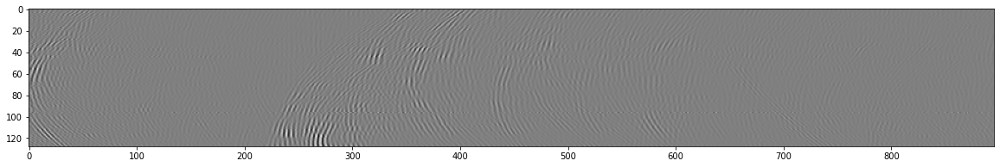

In [450]:
temp2 = []
temp3 = []
for i in range(RF.shape[0]):
    rcv = tf.expand_dims(tf.expand_dims(tf.convert_to_tensor(RF[i,:,:],dtype='float32'),0),3)
    temp3.append(np.squeeze(rcv))
    temp = unet_AE(rcv,training=False)
    temp2.append(np.squeeze(temp))
plt.figure(1,figsize=(20,5))
plt.imshow(np.squeeze(temp))
IQ_ = tf.stack(temp2)
IQ = np.transpose(np.reshape(IQ_,(Nframes,na,RF.shape[1],RF.shape[2])),(2,3,0,1))
temp4 = np.stack(temp3)
RF_ = np.transpose(np.reshape(temp4,(Nframes,na,RF.shape[1],RF.shape[2])),(2,3,0,1))
print(IQ.shape)
print(RF_.shape)

In [451]:
import math
from numba import jit

imXres = 1/4
imZres = 1/8
numelements = 128
fc = 15.625e6
spacing = .1e-3/(1540/fc)
imXrange = np.arange(np.floor(-spacing*numelements/2-1),np.ceil(spacing*numelements/2+1)+imXres,imXres)
imXsize = len(imXrange)
imZrange = np.arange(P["startDepth"][0][0],P["endDepth"][0][0]+imZres,imZres)
imZsize = len(imZrange)
Fnumber = 1
ppw = 4
lens = 1540*(.05/2145+0.48/1147)

xcoords, zcoords = np.meshgrid(imXrange,imZrange)
img = np.zeros((imZsize,imXsize))
angles = np.pi/180*np.linspace(P["maxAngle"][0][0],-P["maxAngle"][0][0],int(P["na"][0][0]))
Relts = spacing*(np.linspace(-(numelements-1)/2,(numelements-1)/2,numelements))
final_delay = np.zeros((imZsize,imXsize,numelements,na),dtype='int32')
alpha = np.zeros_like(final_delay,dtype='float64')
apod = np.zeros_like(alpha,dtype='bool')
offset_delay = np.ones_like(img)*P['startDepth'][0][0]*2
lens_delay = np.ones_like(img)*lens*2
a = zcoords/Fnumber/2

for i, angle in enumerate(angles):
  angle_delay = np.abs(math.atan(angle)*imXrange[0])
  for element in range(numelements):
    apod[:,:,element,i] = np.array((xcoords-a < Relts[element]))
    forward_delay = zcoords*math.cos(angle) + xcoords*math.sin(angle)
    backwards_delay = np.sqrt((xcoords-Relts[element])**2+ zcoords**2)
    sample_delay = (forward_delay + backwards_delay + angle_delay + lens_delay - offset_delay)*ppw
    final_delay[:,:,element,i] = sample_delay.astype('int32')
    alpha[:,:,element,i] = sample_delay - np.floor(sample_delay)

@jit(nopython=True)
def beamform(img,RF,alpha,final_delay,apod):
  for ifrm in range(RF.shape[2]):
    for i in range(final_delay.shape[0]):
      for j in range(final_delay.shape[1]):
        for angle in range(final_delay.shape[3]):
          for element in range(final_delay.shape[2]):
            if apod[i,j,element,angle]:
              img[i,j,ifrm] += (1-alpha[i,j,element,angle])*RF[element,final_delay[i,j,element,angle],ifrm,angle]+(alpha[i,j,element,angle])*RF[element,final_delay[i,j,element,angle]+1,ifrm,angle]
  return img

In [452]:
beamform_args = {
    'alpha': alpha,
    'final_delay': final_delay,
    'apod': apod
}
img = np.zeros((imZsize,imXsize,Nframes))
img2 = np.zeros((imZsize,imXsize,Nframes))
image = beamform(img,RF_,**beamform_args)
unet_image = beamform(img2,IQ,**beamform_args)

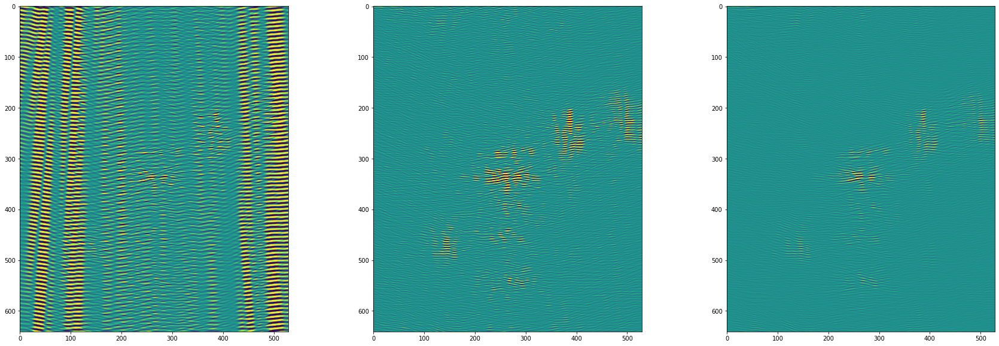

In [463]:
imargs = {'vmin':-15, 'vmax':15}
frame = 4
plt.figure(1,figsize=(30,10))
plt.set_cmap('viridis')
plt.subplot(1,3,1)
plt.imshow(image[:,:,frame],**imargs)
plt.subplot(1,3,2)
plt.imshow(unet_image[:,:,frame],**imargs)
plt.subplot(1,3,3)
plt.imshow(image[:,:,1],**imargs)
plt.savefig(os.path.join(evaluation_folder,'RF_filtered.png'))

In [454]:
def bmode(IM):
  return 20*np.log10(np.abs(hilbert(IM)/np.max(np.max(np.abs(hilbert(IM))))))

In [455]:
from scipy.signal import butter, filtfilt, hilbert, iirnotch, lfilter
import copy

filter_order = np.arange(1,6)
#f0 = P["frequency"][0][0]*1e6
f0 = 4e6
fs = 4*fc;#fc*(1/(imZres/2))
#fs = 62.5e6
Q = 100
A = []; B = []
for i, order in enumerate(filter_order):
  cutoff = order*np.array((f0-0.15e6,f0+0.15e6))
  #cutoff = order*f0
  b, a = butter(2,cutoff/(fs/2),'bandstop')
  #b, a = iirnotch(cutoff,Q,fs)
  A.append(a)
  B.append(b)


bf_image = copy.deepcopy(image)
for i in range(bf_image.shape[2]):
  for j in range(bf_image.shape[1]):
    temp = bf_image[:,j,i]
    for b,a in zip(B,A):
      temp = filtfilt(b,a, temp)
    bf_image[:,j,i] = temp



(0.0, 25.0)

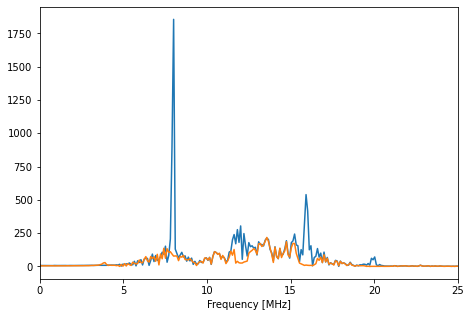

In [456]:
plt.figure(1,figsize=(7.5,5))
aa = np.fft.fftshift(np.abs(np.fft.fft(image[:,250,5])))
bb = np.fft.fftshift(np.abs(np.fft.fft(bf_image[:,250,5])))
plt.plot(np.linspace(-1,1,image.shape[0])*fs*1e-6/2,aa)
plt.plot(np.linspace(-1,1,image.shape[0])*fs*1e-6/2,bb)
plt.xlabel('Frequency [MHz]')
plt.xlim((0,25))

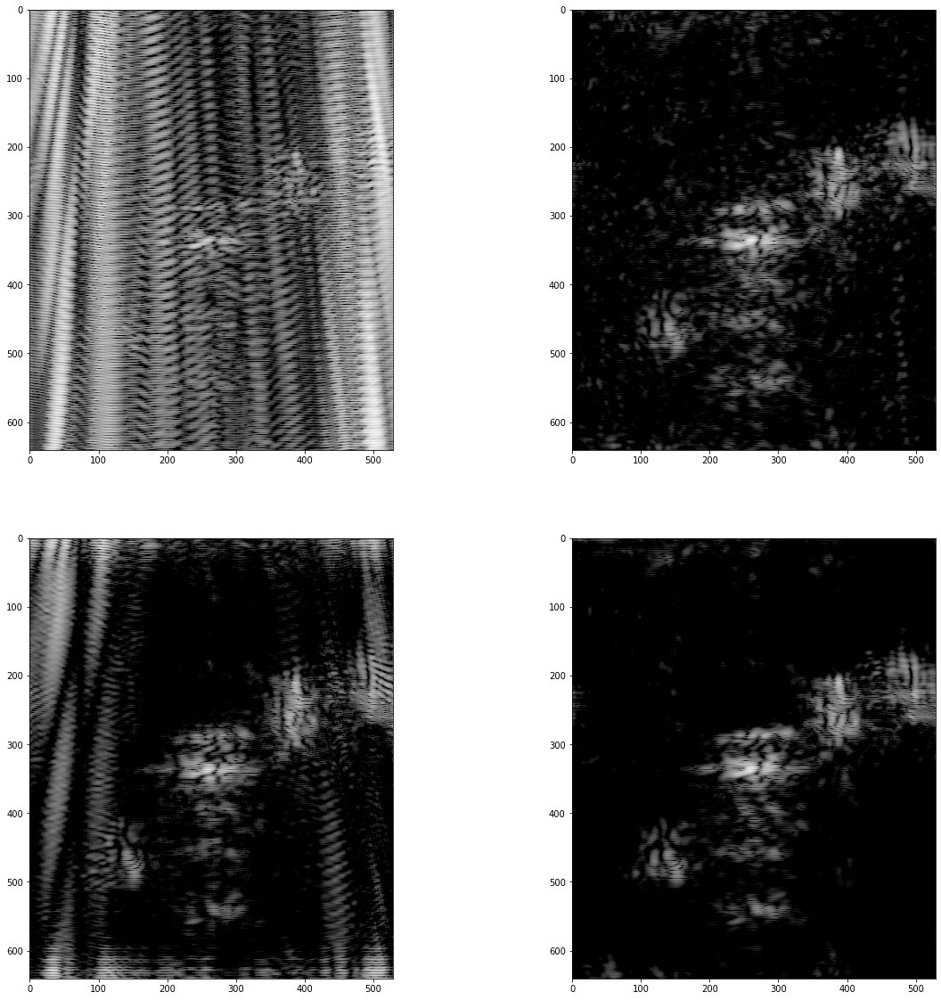

In [462]:
frame = 4
plt.figure(1,figsize=(20,20))
plt.set_cmap('gray')

plt.subplot(2,2,1)
plt.imshow(bmode(image[:,:,frame]),vmin=-25,vmax=0)
plt.subplot(2,2,2)
plt.imshow(bmode(unet_image[:,:,frame]),vmin=-25,vmax=0)
plt.subplot(2,2,3)
plt.imshow(bmode(bf_image[:,:,frame]),vmin=-25,vmax=0)
plt.subplot(2,2,4)
plt.imshow(bmode(image[:,:,0]),vmin=-25,vmax=0)
plt.set_cmap('gray')
plt.savefig(os.path.join(evaluation_folder,'beamformed_results.png'))

In [459]:
import matplotlib.animation
plt.rcParams["animation.html"] = "jshtml"

RF = np.zeros_like(image)
RF2 = np.zeros_like(image)
RF3 = np.zeros_like(image)
for i in range(image.shape[2]):
  RF[:,:,i] = bmode(image[:,:,i])
  RF2[:,:,i] = bmode(unet_image[:,:,i])
  RF3[:,:,i] = bmode(bf_image[:,:,i])

RF[(RF<-50)] = -50
RF2[(RF2<-50)] = -50
RF3[(RF3<-50)] = -50

fig, (ax1,ax2,ax3) = plt.subplots(1,3,figsize=(21,7))
scale = {'vmin':-25,'vmax':0}
im1 = ax1.imshow(RF[:,:,0],**scale)
im2 = ax2.imshow(RF2[:,:,0],**scale)
im3 = ax3.imshow(RF3[:,:,0],**scale)

plt.close()
def init():
  im1.set_data(RF[:,:,0])
  im2.set_data(RF2[:,:,0])
  im3.set_data(RF3[:,:,0])
  return im1, im2, im3

def animate(i):
  im1.set_array(RF[:,:,i])
  im2.set_array(RF2[:,:,i])
  im3.set_array(RF3[:,:,i])
  return im1, im2, im3

ani = matplotlib.animation.FuncAnimation(fig, animate, frames = 19)
ani.save(os.path.join(evaluation_folder,'artifact_filtercomparison_example.mp4'))
ani

In [482]:
MSE = np.zeros((RF.shape[2],2))
for frame in range(RF.shape[2]):
  if frame > 1 and frame < 8:
    MSE[frame,0] = (np.mean((RF2[:,:,frame]-RF[:,:,0])**2))
    MSE[frame,1] = (np.mean((RF3[:,:,frame]-RF[:,:,0])**2))
  else:
    MSE[frame,0] = (np.mean((RF2[:,:,frame]-RF[:,:,frame])**2))
    MSE[frame,1] = (np.mean((RF3[:,:,frame]-RF[:,:,frame])**2))

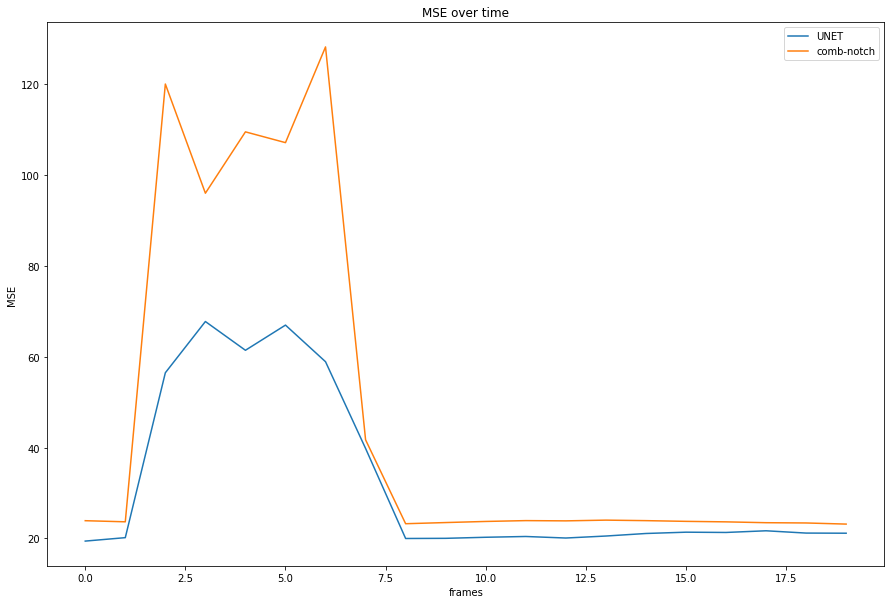

In [490]:
fig = plt.figure(1,figsize=(15,10))
plt.plot(MSE)
plt.legend(('UNET','comb-notch'))
plt.title('MSE over time')
plt.xlabel('frames')
plt.ylabel('MSE')
plt.savefig(os.path.join(evaluation_folder,'MSE.png'))